<a href="https://colab.research.google.com/github/a-edel/Data-Science-with-Python-Homework/blob/main/Section_19_Project.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

column_names = [
    "symboling", "normalized-losses", "make", "fuel-type", "aspiration",
    "num-of-doors", "body-style", "drive-wheels", "engine-location",
    "wheel-base", "length", "width", "height", "curb-weight",
    "engine-type", "num-of-cylinders", "engine-size", "fuel-system",
    "bore", "stroke", "compression-ratio", "horsepower", "peak-rpm",
    "city-mpg", "highway-mpg", "price"
]
df = pd.read_csv("https://raw.githubusercontent.com/a-edel/Data-Science-with-Python-Homework/main/imports-85.data", names=column_names)
df.columns = df.columns.str.capitalize()

print(df.head())


   Symboling Normalized-losses         Make Fuel-type Aspiration Num-of-doors  \
0          3                 ?  alfa-romero       gas        std          two   
1          3                 ?  alfa-romero       gas        std          two   
2          1                 ?  alfa-romero       gas        std          two   
3          2               164         audi       gas        std         four   
4          2               164         audi       gas        std         four   

    Body-style Drive-wheels Engine-location  Wheel-base  ...  Engine-size  \
0  convertible          rwd           front        88.6  ...          130   
1  convertible          rwd           front        88.6  ...          130   
2    hatchback          rwd           front        94.5  ...          152   
3        sedan          fwd           front        99.8  ...          109   
4        sedan          4wd           front        99.4  ...          136   

   Fuel-system  Bore  Stroke Compression-ratio Hor

In [ ]:
print(df.shape)

(205, 26)


In [ ]:
print(df.dtypes)

Symboling              int64
Normalized-losses     object
Make                  object
Fuel-type             object
Aspiration            object
Num-of-doors          object
Body-style            object
Drive-wheels          object
Engine-location       object
Wheel-base           float64
Length               float64
Width                float64
Height               float64
Curb-weight            int64
Engine-type           object
Num-of-cylinders      object
Engine-size            int64
Fuel-system           object
Bore                  object
Stroke                object
Compression-ratio    float64
Horsepower            object
Peak-rpm              object
City-mpg               int64
Highway-mpg            int64
Price                 object
dtype: object


In [ ]:
df = df.apply(pd.to_numeric, errors='ignore')

print(df.dtypes)

Symboling              int64
Normalized-losses     object
Make                  object
Fuel-type             object
Aspiration            object
Num-of-doors          object
Body-style            object
Drive-wheels          object
Engine-location       object
Wheel-base           float64
Length               float64
Width                float64
Height               float64
Curb-weight            int64
Engine-type           object
Num-of-cylinders      object
Engine-size            int64
Fuel-system           object
Bore                  object
Stroke                object
Compression-ratio    float64
Horsepower            object
Peak-rpm              object
City-mpg               int64
Highway-mpg            int64
Price                 object
dtype: object


In [ ]:
p = (df.isnull().sum()/df.shape[0])*100
print(p[p>0])

Series([], dtype: float64)


array([[<Axes: title={'center': 'Symboling'}>,
        <Axes: title={'center': 'Wheel-base'}>,
        <Axes: title={'center': 'Length'}>],
       [<Axes: title={'center': 'Width'}>,
        <Axes: title={'center': 'Height'}>,
        <Axes: title={'center': 'Curb-weight'}>],
       [<Axes: title={'center': 'Engine-size'}>,
        <Axes: title={'center': 'Compression-ratio'}>,
        <Axes: title={'center': 'City-mpg'}>],
       [<Axes: title={'center': 'Highway-mpg'}>, <Axes: >, <Axes: >]],
      dtype=object)

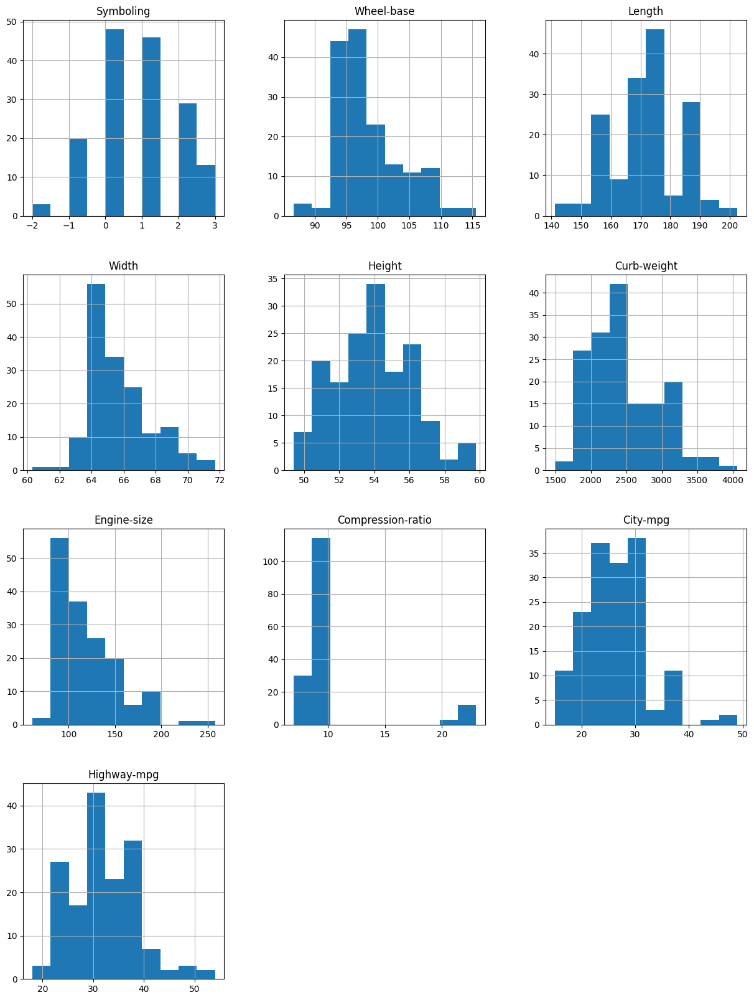

In [ ]:
df.replace('?', np.nan, inplace=True)
df.dropna(inplace=True)

df.hist(figsize=(15,20))


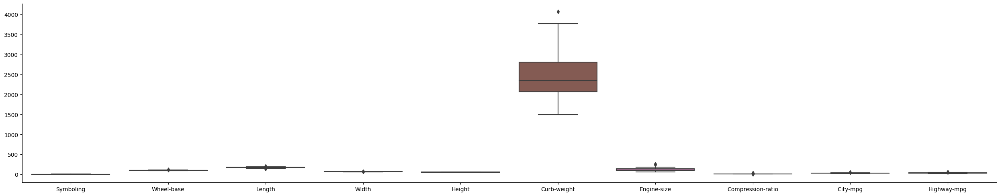

In [ ]:
continuous_columns = df.select_dtypes(include=['int', 'float']).columns
vals = df[continuous_columns]
sns.catplot(data=vals, kind='box', aspect=5)

<Axes: >

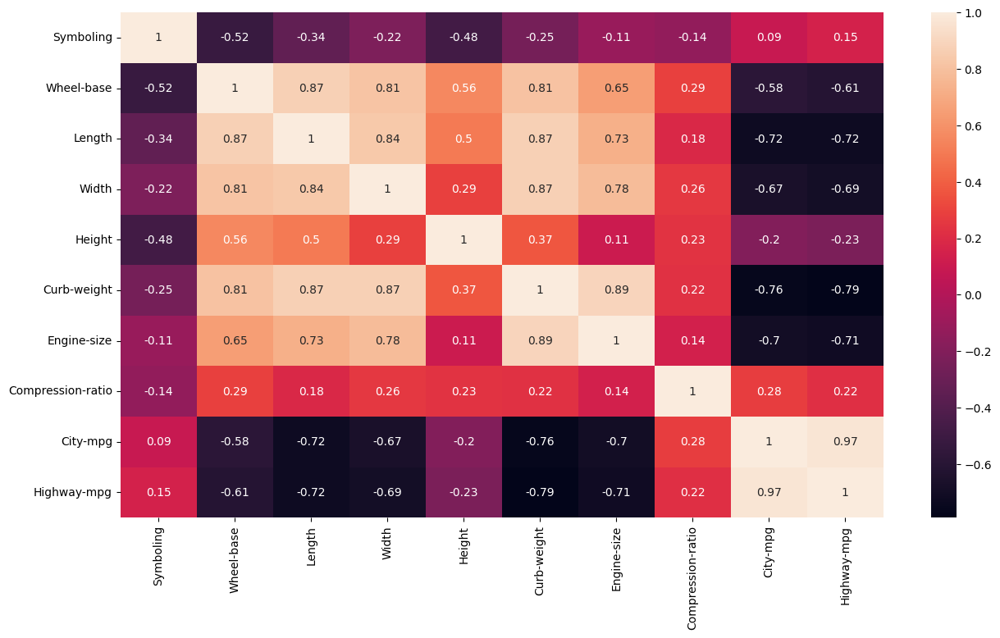

In [ ]:
plt.figure(figsize=(15,8))
sns.heatmap(vals.corr(), annot=True)

In [ ]:
!pip install --upgrade ydata-profiling
!pip install --upgrade typing-extensions

In [ ]:
import ydata_profiling

ydata_profiling.ProfileReport(df)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [ ]:
print(df['Make'].value_counts())

toyota           31
nissan           18
honda            13
subaru           12
mazda            11
volvo            11
mitsubishi       10
dodge             8
volkswagen        8
peugot            7
plymouth          6
saab              6
mercedes-benz     5
bmw               4
audi              4
chevrolet         3
jaguar            1
porsche           1
Name: Make, dtype: int64


<Axes: >

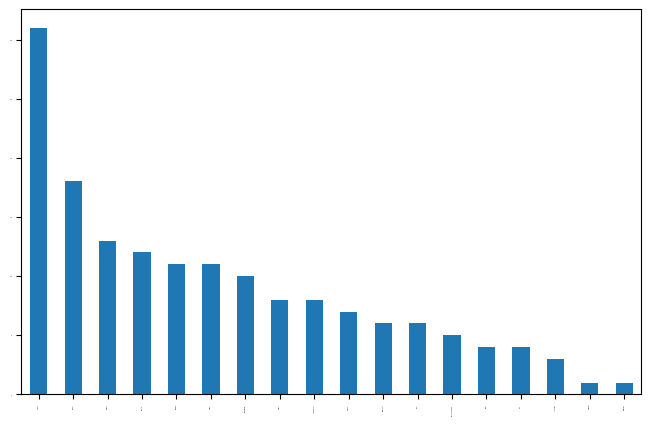

In [ ]:
plt.figure(figsize=(8,5))
df['Make'].value_counts().plot(kind='bar', fontsize=0)

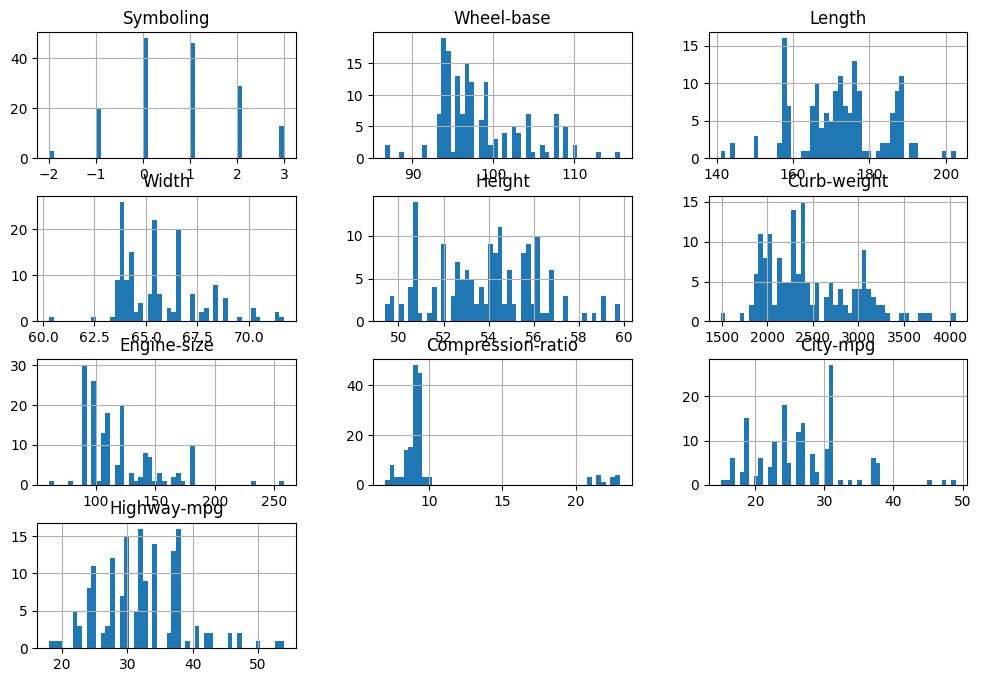

In [ ]:
numerical_df = df.select_dtypes(include='number')
numerical_df.hist(bins=50, figsize=(12,8))
plt.show()

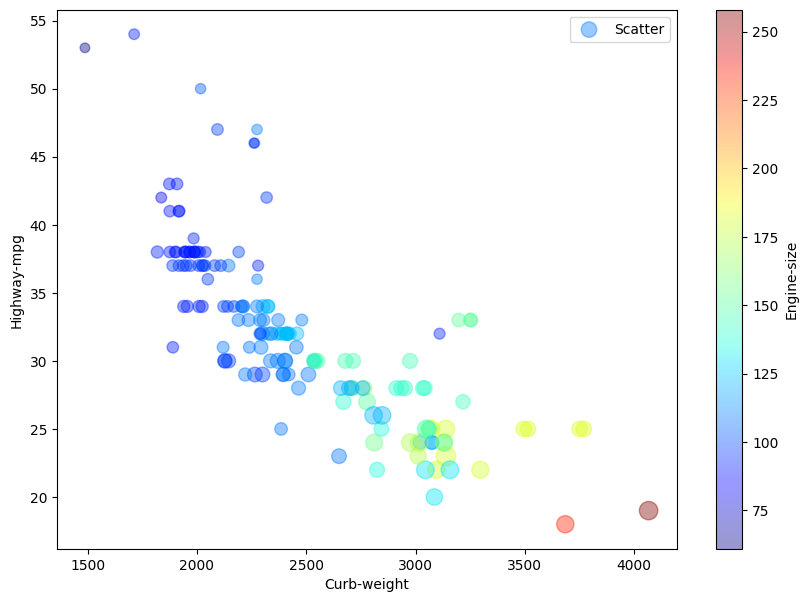

In [ ]:
df['Horsepower'] = pd.to_numeric(df['Horsepower'], errors='coerce')
df.plot(kind='scatter', x='Curb-weight', y='Highway-mpg', alpha=.4, s=df['Horsepower'], label='Scatter', figsize=(10,7), c='Engine-size', cmap=plt.get_cmap('jet'), colorbar=True)

plt.legend()

array([[<Axes: xlabel='Engine-size', ylabel='Engine-size'>,
        <Axes: xlabel='Curb-weight', ylabel='Engine-size'>,
        <Axes: xlabel='Horsepower', ylabel='Engine-size'>,
        <Axes: xlabel='Highway-mpg', ylabel='Engine-size'>],
       [<Axes: xlabel='Engine-size', ylabel='Curb-weight'>,
        <Axes: xlabel='Curb-weight', ylabel='Curb-weight'>,
        <Axes: xlabel='Horsepower', ylabel='Curb-weight'>,
        <Axes: xlabel='Highway-mpg', ylabel='Curb-weight'>],
       [<Axes: xlabel='Engine-size', ylabel='Horsepower'>,
        <Axes: xlabel='Curb-weight', ylabel='Horsepower'>,
        <Axes: xlabel='Horsepower', ylabel='Horsepower'>,
        <Axes: xlabel='Highway-mpg', ylabel='Horsepower'>],
       [<Axes: xlabel='Engine-size', ylabel='Highway-mpg'>,
        <Axes: xlabel='Curb-weight', ylabel='Highway-mpg'>,
        <Axes: xlabel='Horsepower', ylabel='Highway-mpg'>,
        <Axes: xlabel='Highway-mpg', ylabel='Highway-mpg'>]], dtype=object)

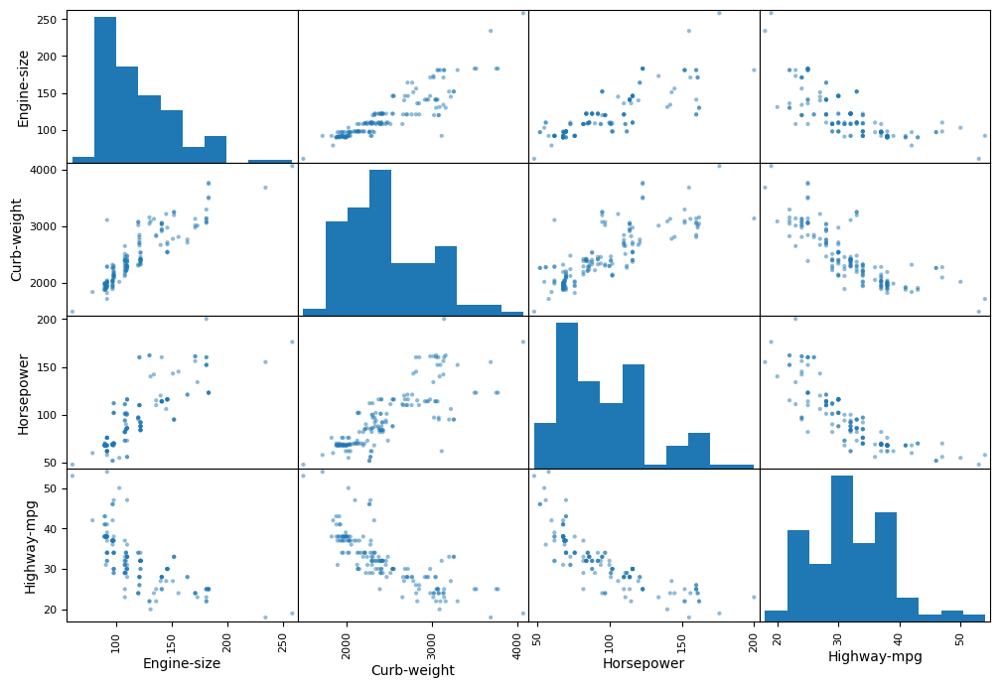

In [ ]:
from pandas.plotting import scatter_matrix

attributes = ['Engine-size', 'Curb-weight', 'Horsepower', 'Highway-mpg']
scatter_matrix(df[attributes], figsize=(12,8))

In [ ]:
from sklearn.impute import SimpleImputer
from sklearn import  preprocessing

df_SI = df.copy()
numeric_column_names = df.select_dtypes(include='number').columns.tolist()
df_SI = df[numeric_column_names]
imp = SimpleImputer(missing_values=np.nan, strategy='median')
min_max_scaler = preprocessing.MinMaxScaler()
x_scaled = min_max_scaler.fit_transform(df_SI)
df_scaled = pd.DataFrame(x_scaled)
df_scaled.columns = numeric_column_names
print(df_scaled.head())

   Symboling  Wheel-base    Length     Width    Height  Curb-weight  \
0        0.8    0.455172  0.577236  0.517544  0.471154     0.329325   
1        0.8    0.441379  0.577236  0.535088  0.471154     0.518231   
2        0.6    0.662069  0.839024  0.973684  0.605769     0.525989   
3        0.6    0.662069  0.839024  0.973684  0.625000     0.619860   
4        0.8    0.503448  0.580488  0.394737  0.471154     0.351823   

   Engine-size  Compression-ratio  Horsepower  City-mpg  Highway-mpg  
0     0.243655            0.18750    0.355263  0.264706     0.333333  
1     0.380711            0.06250    0.440789  0.088235     0.111111  
2     0.380711            0.09375    0.407895  0.117647     0.194444  
3     0.355330            0.08125    0.605263  0.058824     0.055556  
4     0.238579            0.11250    0.348684  0.235294     0.305556  


In [ ]:
from sklearn.linear_model import LinearRegression

y = df_scaled['Highway-mpg'].copy()
X = df_scaled.drop(['Highway-mpg'], axis=1)

lin_reg = LinearRegression().fit(X,y)
r_sq = lin_reg.score(X, y)

print(r_sq)

0.9556749288737194


In [ ]:
import statsmodels.api as sm

model = sm.OLS(y, X)
results = model.fit()

print(results.summary())

                                 OLS Regression Results                                
Dep. Variable:            Highway-mpg   R-squared (uncentered):                   0.992
Model:                            OLS   Adj. R-squared (uncentered):              0.992
Method:                 Least Squares   F-statistic:                              1874.
Date:                Tue, 19 Dec 2023   Prob (F-statistic):                   3.02e-151
Time:                        02:02:22   Log-Likelihood:                          293.50
No. Observations:                 159   AIC:                                     -567.0
Df Residuals:                     149   BIC:                                     -536.3
Df Model:                          10                                                  
Covariance Type:            nonrobust                                                  
                        coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------